In [253]:
import pandas as pd
import numpy as np
import dataprep.eda as eda
import seaborn as sns
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.datasets import load_dataset
import requests
from io import BytesIO
import matplotlib.pyplot as plt
from pycaret.anomaly import *

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split


from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import pickle
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

import shap

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


1. Lectura de la base de datos

In [108]:
url = 'https://github.com/gonzalezulises/Reto_supermercado/raw/main/BASE%20PROBLEMA_1.xlsx'

In [109]:
base_problema = pd.read_excel(url,sheet_name=None)

In [110]:
df_datos = base_problema['PROBLEMA_1']

In [111]:
df_diccionario = base_problema['DICCIONARIO']

In [112]:
df_datos.head(5)

,enc,p5_1,p5_2,p5_3,p5_4,p5_5,p5_6,p5_7,p5_8,p5_9,p5_10,p5_11,p7_1,p7_2,p7_3,p7_4,p7_5,p7_6,p7_7,p8
0,1,9,8,8,9,9,9,8,7,8,7,7,10,10,10,9,10,10,10,8
1,2,10,10,10,10,10,10,10,10,10,10,10,9,10,10,10,10,10,10,10
2,3,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10
3,4,10,10,10,10,5,10,10,10,10,10,10,8,10,10,10,10,10,10,10
4,5,10,10,10,10,10,9,10,10,10,9,9,10,10,10,10,10,10,10,10


In [113]:
df_diccionario.head(20)

,Variable,Etiqueta
0,enc,NUMERO DE ENCUESTA
1,p5_1,SOLUCION DADA EN LA TIENDA
2,p5_2,AGILIDAD MOSTRADA
3,p5_3,INTERES MOSTRADO POR EL COLABORADOR
4,p5_4,AMABILIDAD Y TRATO DEL COLABORADOR
5,p5_5,OFERTA DE PRODUCTOS Y SERVICIOS
6,p5_6,NIVEL DE CONOCIMIENTOS DEL COLABORADOR / CAJERO
7,p5_7,CLARIDAD DE LA INFORMACIÓN
8,p5_8,TIEMPO DE ESPERA EN SER ATENDIDO
9,p5_9,TIEMPO DE ATENCIÓN BRINDADA


2. Entender el negocio

Entender el negocio en este proyecto implica comprender a fondo todos los aspectos relacionados con la cadena de supermercados y su modelo de negocio. Esto incluye:

- Modelo de servicio y atención al cliente: Comprender cómo se estructura y opera el servicio al cliente en la cadena de supermercados, desde la entrada del cliente a la tienda hasta su salida, incluyendo el proceso de compra, atención en cajas, y servicios adicionales ofrecidos.
- Segmentos de clientes: Identificar los diferentes segmentos de clientes que frecuentan las tiendas de la cadena, sus necesidades, preferencias y comportamientos de compra.
- Competencia y mercado: Analizar el entorno competitivo en el que opera la cadena de supermercados, incluyendo la presencia de competidores locales y globales, así como las tendencias del mercado y las expectativas de los clientes.
- Factores de éxito y desafíos: Identificar los factores que han contribuido históricamente al éxito de la empresa, así como los desafíos y obstáculos que enfrenta en la actualidad, especialmente en relación con la satisfacción del cliente.
- Estrategias y acciones previas: Revisar las estrategias y acciones previamente implementadas por la empresa para abordar la disminución en la satisfacción del cliente, así como evaluar su efectividad y las lecciones aprendidas.

En esta primera instancia, creería que los objetivos que podemos definir son:

Objetivos de negocio: (he redactado supuestos. En la vida real yo co-crearía con el área de negocio, facilitando el espacio de discusión)

- Aumentar el nivel de satisfacción de los clientes en la cadena de supermercados.
- Mejorar la recomendación y lealtad de los clientes hacia la marca.
- Reducir la pérdida de clientes y aumentar la retención.
- Incrementar la rentabilidad a largo plazo mediante la mejora del servicio al cliente.

Objetivos analíticos: (acá propondría, estos objetivos los plantearía como la estrategia de soporte a la toma de decisión)

- Identificar los principales factores que afectan negativamente la satisfacción del cliente durante el proceso de atención en las tiendas.
- Cuantificar el impacto de cada factor en la satisfacción del cliente.
- Desarrollar modelos predictivos para pronosticar el nivel de satisfacción del cliente en función de diferentes variables.
- Proporcionar recomendaciones específicas para mejorar la satisfacción del cliente en función de los insights obtenidos del análisis de datos.

3. Identificación de faltantes y duplicados

In [114]:
#iniciaré un EDA

In [115]:
df_datos.shape

(4231, 20)

20 columnas con 4231 filas, para un aprox de 84620 datos

In [116]:
df_datos.describe().T

,count,mean,std,min,25%,50%,75%,max
enc,4231.0,4956.206334,3112.306407,1.0,1972.5,4435.0,7956.5,9661.0
p5_1,4231.0,8.675254,1.645813,1.0,8.0,9.0,10.0,10.0
p5_2,4231.0,8.717797,1.587410,1.0,8.0,9.0,10.0,10.0
p5_3,4231.0,8.732451,1.552024,1.0,8.0,9.0,10.0,10.0
p5_4,4231.0,8.861262,1.465567,1.0,8.0,9.0,10.0,10.0
p5_5,4231.0,7.400851,2.845267,1.0,6.0,8.0,10.0,10.0
p5_6,4231.0,8.763177,1.494569,1.0,8.0,9.0,10.0,10.0
p5_7,4231.0,8.793193,1.509469,1.0,8.0,9.0,10.0,10.0
p5_8,4231.0,8.703853,1.667796,1.0,8.0,9.0,10.0,10.0
p5_9,4231.0,8.836682,1.522421,1.0,8.0,9.0,10.0,10.0


In [117]:
df_datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4231 entries, 0 to 4230
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   enc     4231 non-null   int64
 1   p5_1    4231 non-null   int64
 2   p5_2    4231 non-null   int64
 3   p5_3    4231 non-null   int64
 4   p5_4    4231 non-null   int64
 5   p5_5    4231 non-null   int64
 6   p5_6    4231 non-null   int64
 7   p5_7    4231 non-null   int64
 8   p5_8    4231 non-null   int64
 9   p5_9    4231 non-null   int64
 10  p5_10   4231 non-null   int64
 11  p5_11   4231 non-null   int64
 12  p7_1    4231 non-null   int64
 13  p7_2    4231 non-null   int64
 14  p7_3    4231 non-null   int64
 15  p7_4    4231 non-null   int64
 16  p7_5    4231 non-null   int64
 17  p7_6    4231 non-null   int64
 18  p7_7    4231 non-null   int64
 19  p8      4231 non-null   int64
dtypes: int64(20)
memory usage: 661.2 KB


In [118]:
df_datos.dtypes

enc      int64
p5_1     int64
p5_2     int64
p5_3     int64
p5_4     int64
p5_5     int64
p5_6     int64
p5_7     int64
p5_8     int64
p5_9     int64
p5_10    int64
p5_11    int64
p7_1     int64
p7_2     int64
p7_3     int64
p7_4     int64
p7_5     int64
p7_6     int64
p7_7     int64
p8       int64
dtype: object

In [119]:
df_datos.isna().sum()

enc      0
p5_1     0
p5_2     0
p5_3     0
p5_4     0
p5_5     0
p5_6     0
p5_7     0
p5_8     0
p5_9     0
p5_10    0
p5_11    0
p7_1     0
p7_2     0
p7_3     0
p7_4     0
p7_5     0
p7_6     0
p7_7     0
p8       0
dtype: int64

In [120]:
df_datos.isnull().mean()*100

enc      0.0
p5_1     0.0
p5_2     0.0
p5_3     0.0
p5_4     0.0
p5_5     0.0
p5_6     0.0
p5_7     0.0
p5_8     0.0
p5_9     0.0
p5_10    0.0
p5_11    0.0
p7_1     0.0
p7_2     0.0
p7_3     0.0
p7_4     0.0
p7_5     0.0
p7_6     0.0
p7_7     0.0
p8       0.0
dtype: float64

No hay presencia de valores faltantes

In [121]:
df_datos.duplicated().sum()

0

No hay valores duplicados

In [122]:
#utilizando el módulo eda de dataprep para hacer un análisis exploratorio más avanzado

  0%|                                                                   | 0/1736 [00:00<?, ?it/s]


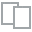
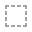
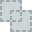
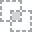
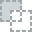
...
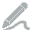
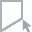
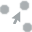
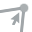
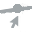

In [123]:
plot(df_datos)

In [124]:
df_datos2 = df_datos.drop('enc',axis=1)
df_datos2

,p5_1,p5_2,p5_3,p5_4,p5_5,p5_6,p5_7,p5_8,p5_9,p5_10,p5_11,p7_1,p7_2,p7_3,p7_4,p7_5,p7_6,p7_7,p8
0,9,8,8,9,9,9,8,7,8,7,7,10,10,10,9,10,10,10,8
1,10,10,10,10,10,10,10,10,10,10,10,9,10,10,10,10,10,10,10
2,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10
3,10,10,10,10,5,10,10,10,10,10,10,8,10,10,10,10,10,10,10
4,10,10,10,10,10,9,10,10,10,9,9,10,10,10,10,10,10,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4226,8,7,7,9,8,8,8,8,8,8,9,8,8,9,9,8,8,8,8
4227,9,9,9,10,9,8,9,8,8,8,9,10,10,9,9,9,9,9,9
4228,8,8,8,9,8,7,8,8,9,8,8,9,9,9,8,8,9,9,8
4229,8,8,8,7,7,8,8,7,8,8,8,8,8,8,8,8,8,8,8



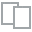
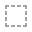
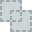
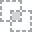
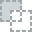
...
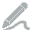
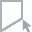
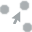
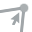
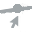

In [125]:
plot_correlation(df_datos2)

4. Identificación de outliers

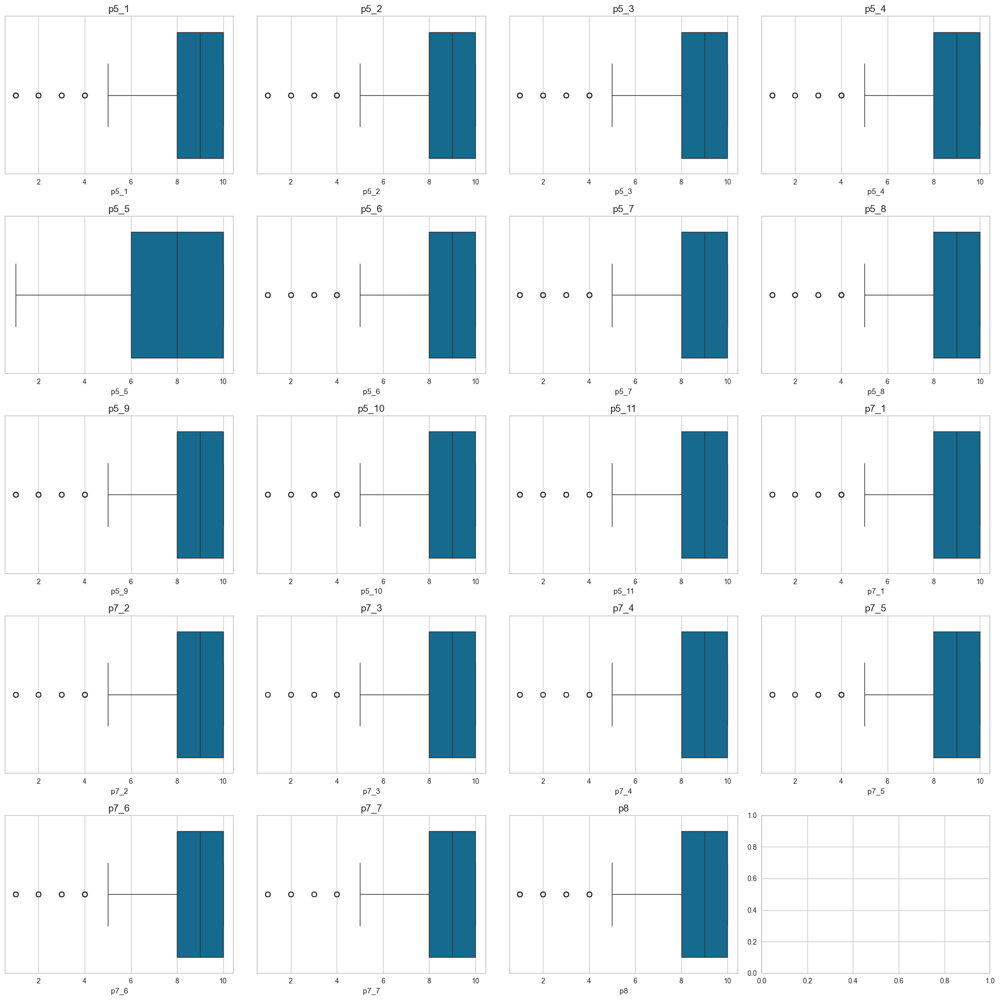

In [126]:
#Diseñando diagramas boxplot para visualizar si hay outliers
columnas = ['p5_1', 'p5_2', 'p5_3', 'p5_4', 'p5_5', 'p5_6', 'p5_7', 'p5_8', 'p5_9', 'p5_10', 
            'p5_11', 'p7_1', 'p7_2', 'p7_3', 'p7_4', 'p7_5', 'p7_6', 'p7_7', 'p8']

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20, 20))
axes = axes.flatten() # Aplano la lista de ejes para facilitar el uso de un solo bucle

for i, columna in enumerate(columnas):
    ax = axes[i]
    sns.boxplot(data=df_datos2, x=columna, ax=ax)
    ax.set_title(columna, fontsize=14)
    
fig.tight_layout()
plt.show()

In [127]:
#gráficamente podemos ver puntos que salen del rango, voy a proceder a analizar las anomalías mediante pycaret

instanciando al algoritmo

In [128]:
anomalia = AnomalyExperiment()

Configurando el algoritmo

In [129]:
anomalia.setup(data=df_datos2, session_id=100)

,Description,Value
0,Session id,100
1,Original data shape,"(4231, 19)"
2,Transformed data shape,"(4231, 19)"
3,Numeric features,19
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


Utilizaré el isolationforest como modelo

In [130]:
ifo = anomalia.create_model('iforest',fraction=0.05)

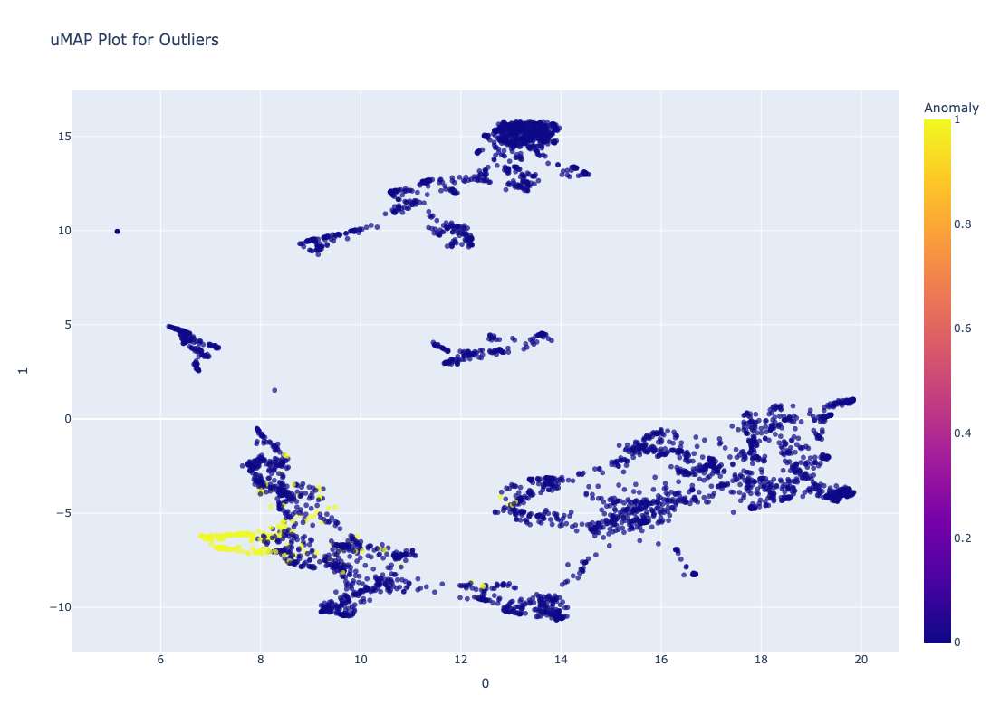

In [131]:
anomalia.plot_model(ifo, plot='umap')

Podemos detectar los puntos amarillos de anomalias, sin embargo lo voy a ver en 3d para tener un entendimiento mejor en el espacio

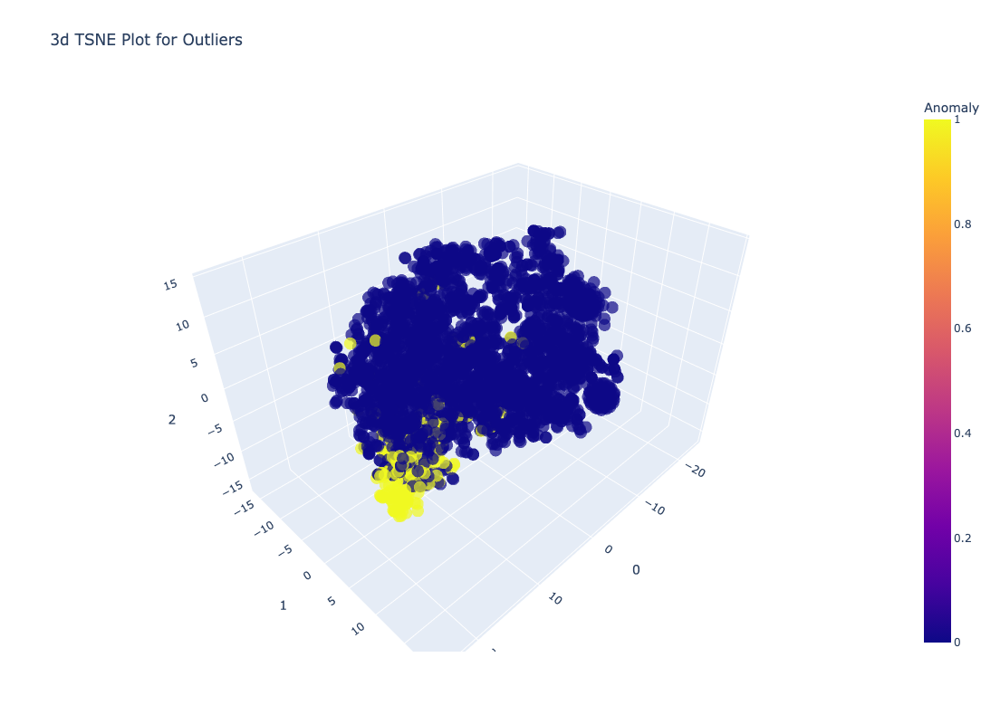

In [132]:
anomalia.plot_model(ifo,plot='tsne')

5. ¿Qué pregunta busco responder con mi modelo?

¿Cuáles son los factores que impactan negativamente en la satisfacción del cliente durante el proceso de atención en las tiendas de la cadena de supermercados?. Yo estaría tratando de identificar las variables o características específicas que están contribuyendo a la insatisfacción de los clientes durante su experiencia de compra en las tiendas. Quiero entender qué aspectos del servicio al cliente necesitan ser mejorados para aumentar la satisfacción general de los clientes y, por ende, mejorar la lealtad y retención de clientes en la cadena de supermercados.

6. Agrupar la variable "p8" en :(preguntas de satisfacción {9,10} y otros) para construir la variable dependiente.

La variable dependiente que quiero construir, esta basada en la agrupación de las preguntas de satisfacción, para la variable "SATISFACCIÓN POR EL PROCESO DE ATENCIÓN EN LA TIENDA" (p8). Para crear esta variable,voy a agrupar las preguntas de satisfacción (p5_1 a p5_11) en un solo conjunto y utilizarlas como la medida de satisfacción del cliente durante el proceso de atención en la tienda.

y: "SATISFACCIÓN POR EL PROCESO DE ATENCIÓN EN LA TIENDA" (p8)

X's:

- p5_1: Solución dada en la tienda
- p5_2: Agilidad mostrada
- p5_3: Interés mostrado por el colaborador
- p5_4: Amabilidad y trato del colaborador
- p5_5: Oferta de productos y servicios
- p5_6: Nivel de conocimientos del colaborador/cajero
- p5_7: Claridad de la información
- p5_8: Tiempo de espera en ser atendido
- p5_9: Tiempo de atención brindada
- p5_10: Simpleza durante el proceso de atención
- p5_11: Flexibilidad del colaborador

In [133]:
df_datos3= df_datos2.loc[:, 'p5_1':'p8']
df_datos3.head()

,p5_1,p5_2,p5_3,p5_4,p5_5,p5_6,p5_7,p5_8,p5_9,p5_10,p5_11,p7_1,p7_2,p7_3,p7_4,p7_5,p7_6,p7_7,p8
0,9,8,8,9,9,9,8,7,8,7,7,10,10,10,9,10,10,10,8
1,10,10,10,10,10,10,10,10,10,10,10,9,10,10,10,10,10,10,10
2,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10
3,10,10,10,10,5,10,10,10,10,10,10,8,10,10,10,10,10,10,10
4,10,10,10,10,10,9,10,10,10,9,9,10,10,10,10,10,10,10,10


In [134]:
#este es el nuevo dataframe con el cual vamos a construir el modelo

7. Balancear los datos de ser necesario (reducir clase positiva o aumentar clase
 negativa)

In [135]:
#primero vamos a validar las proporciones de los datos

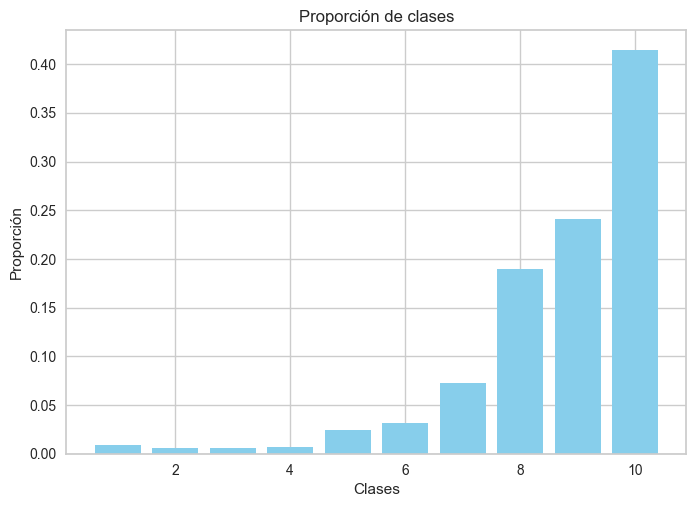

In [136]:
from collections import Counter
y = df_datos3['p8']
proporciones_clases = {key: value / len(y) for key, value in Counter(y).items()}
claves = list(proporciones_clases.keys())
valores = list(proporciones_clases.values())
plt.bar(claves, valores, color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Proporción')
plt.title('Proporción de clases')
plt.show()

Las clases 8,9 y 10, dominan el conjunto de datos, representando casi el 90%. Esto indica un claro desequilibrio, ya que las clases restantes tienen representaciones mucho menores, con algunas clases como la 3, 2, y 4 teniendo menos del 1% de los datos.

Este desequilibrio puede afectar el rendimiento del modelo de ml a desarrollar, ya que tienden a ser sesgados hacia las clases más representadas y pueden no aprender adecuadamente las características de las clases menos representadas.

In [137]:
# Seleccionando los features (X) de df_datos3
X = df_datos3.values

# Creando los conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Aplicando SMOTE para sobremuestrear la clase minoritaria en el conjunto de entrenamiento
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

df_datos3a = pd.DataFrame(X_train_resampled, columns=df_datos3.columns) #nuevo dataframe con datos balanceados
df_datos3a['y_train'] = y_train_resampled
print(df_datos3a.head())


   p5_1  p5_2  p5_3  p5_4  p5_5  p5_6  p5_7  p5_8  p5_9  p5_10  p5_11  p7_1  \
0     9     9     9     9     8     9     9     9     9      9      9     9   
1     8     8     7     7     8     7     8     8     8      7      7     9   
2     9     9     9    10    10    10    10    10    10     10      9     8   
3    10    10    10    10    10    10    10    10    10     10     10    10   
4     9     8     8     8     9     9     9     7     9      9      9     8   

   p7_2  p7_3  p7_4  p7_5  p7_6  p7_7  p8  y_train  
0     9     9     9     9     9     9   8        8  
1     8     8     8     7     7     7   5        5  
2    10     8    10    10     9     9   9        9  
3    10    10    10    10    10    10  10       10  
4     8     8     8     8     9     8   8        8  


In [138]:
#revisando de nuevo la proporción de los datos

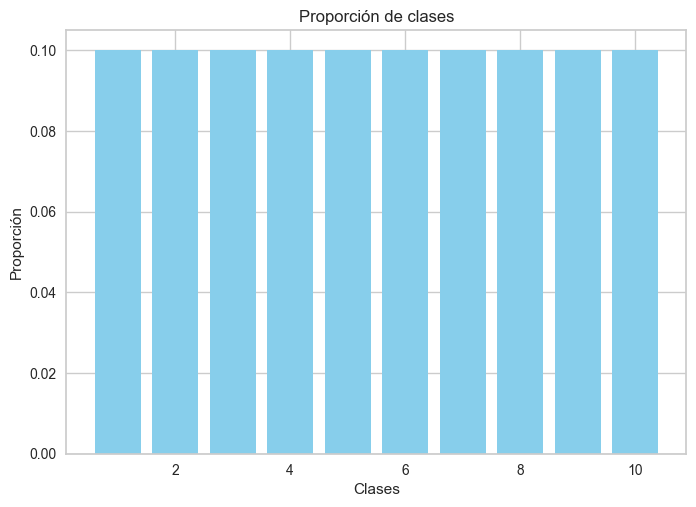

In [139]:
from collections import Counter
y = df_datos3a['p8']
proporciones_clases = {key: value / len(y) for key, value in Counter(y).items()}
claves = list(proporciones_clases.keys())
valores = list(proporciones_clases.values())
plt.bar(claves, valores, color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Proporción')
plt.title('Proporción de clases')
plt.show()

8. Analiza la correlación de las variables (correlación no implica causalidad pero se puede hacer un test para eliminar variables altamente correlacionadas)

In [140]:
df_datos3a.head(1)

,p5_1,p5_2,p5_3,p5_4,p5_5,p5_6,p5_7,p5_8,p5_9,p5_10,p5_11,p7_1,p7_2,p7_3,p7_4,p7_5,p7_6,p7_7,p8,y_train
0,9,9,9,9,8,9,9,9,9,9,9,9,9,9,9,9,9,9,8,8


In [141]:
df_datos3a = df_datos3a.drop('y_train',axis=1)

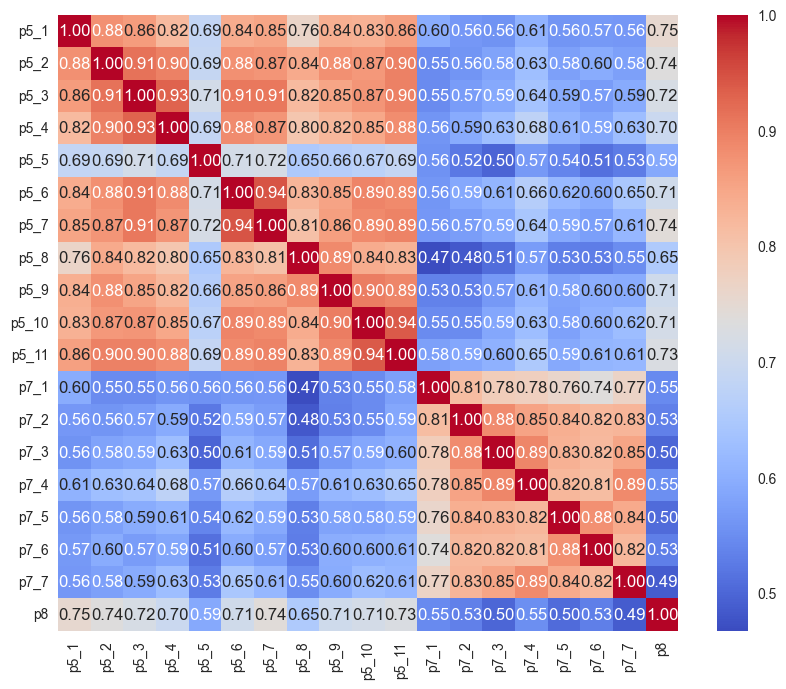

In [142]:
matrix_cc = df_datos3a.corr()
plt.figure(figsize=(10,8))
sns.heatmap(matrix_cc, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

In [143]:
threshold = 0.8 # Estableciando el umbral de correlación

high_corr = [(i, j) for i in matrix_cc.columns for j in matrix_cc.columns if (i != j) and abs(matrix_cc[i][j]) > threshold]
print("Pares de variables altamente correlacionadas:", high_corr)


Pares de variables altamente correlacionadas: [('p5_1', 'p5_2'), ('p5_1', 'p5_3'), ('p5_1', 'p5_4'), ('p5_1', 'p5_6'), ('p5_1', 'p5_7'), ('p5_1', 'p5_9'), ('p5_1', 'p5_10'), ('p5_1', 'p5_11'), ('p5_2', 'p5_1'), ('p5_2', 'p5_3'), ('p5_2', 'p5_4'), ('p5_2', 'p5_6'), ('p5_2', 'p5_7'), ('p5_2', 'p5_8'), ('p5_2', 'p5_9'), ('p5_2', 'p5_10'), ('p5_2', 'p5_11'), ('p5_3', 'p5_1'), ('p5_3', 'p5_2'), ('p5_3', 'p5_4'), ('p5_3', 'p5_6'), ('p5_3', 'p5_7'), ('p5_3', 'p5_8'), ('p5_3', 'p5_9'), ('p5_3', 'p5_10'), ('p5_3', 'p5_11'), ('p5_4', 'p5_1'), ('p5_4', 'p5_2'), ('p5_4', 'p5_3'), ('p5_4', 'p5_6'), ('p5_4', 'p5_7'), ('p5_4', 'p5_9'), ('p5_4', 'p5_10'), ('p5_4', 'p5_11'), ('p5_6', 'p5_1'), ('p5_6', 'p5_2'), ('p5_6', 'p5_3'), ('p5_6', 'p5_4'), ('p5_6', 'p5_7'), ('p5_6', 'p5_8'), ('p5_6', 'p5_9'), ('p5_6', 'p5_10'), ('p5_6', 'p5_11'), ('p5_7', 'p5_1'), ('p5_7', 'p5_2'), ('p5_7', 'p5_3'), ('p5_7', 'p5_4'), ('p5_7', 'p5_6'), ('p5_7', 'p5_8'), ('p5_7', 'p5_9'), ('p5_7', 'p5_10'), ('p5_7', 'p5_11'), ('p5_

In [144]:
#agrupando las variables para ver la cantidad de correlaciones
correlated_groups = {}
for var1, var2 in high_corr:
    if var1 in correlated_groups:
        correlated_groups[var1].add(var2)
    else:
        correlated_groups[var1] = {var2}
    
    if var2 in correlated_groups:
        correlated_groups[var2].add(var1)
    else:
        correlated_groups[var2] = {var1}

In [145]:
for variable, group in correlated_groups.items():
    print(f"Variable '{variable}' está correlacionada con {len(group)} otras variables: {group}")


Variable 'p5_1' está correlacionada con 8 otras variables: {'p5_6', 'p5_10', 'p5_2', 'p5_3', 'p5_11', 'p5_9', 'p5_4', 'p5_7'}
Variable 'p5_2' está correlacionada con 9 otras variables: {'p5_6', 'p5_10', 'p5_11', 'p5_3', 'p5_8', 'p5_1', 'p5_9', 'p5_4', 'p5_7'}
Variable 'p5_3' está correlacionada con 9 otras variables: {'p5_6', 'p5_10', 'p5_2', 'p5_11', 'p5_8', 'p5_1', 'p5_9', 'p5_4', 'p5_7'}
Variable 'p5_4' está correlacionada con 8 otras variables: {'p5_6', 'p5_10', 'p5_2', 'p5_3', 'p5_11', 'p5_1', 'p5_9', 'p5_7'}
Variable 'p5_6' está correlacionada con 9 otras variables: {'p5_10', 'p5_2', 'p5_3', 'p5_8', 'p5_11', 'p5_1', 'p5_9', 'p5_4', 'p5_7'}
Variable 'p5_7' está correlacionada con 9 otras variables: {'p5_6', 'p5_10', 'p5_2', 'p5_3', 'p5_8', 'p5_11', 'p5_1', 'p5_9', 'p5_4'}
Variable 'p5_9' está correlacionada con 9 otras variables: {'p5_6', 'p5_10', 'p5_2', 'p5_3', 'p5_8', 'p5_11', 'p5_1', 'p5_4', 'p5_7'}
Variable 'p5_10' está correlacionada con 9 otras variables: {'p5_6', 'p5_2', '

In [146]:
#Vamos a identificar las variables 'X' que más aportarían al modelo

matrix_de_correlacion = df_datos3a.corr()
target = matrix_de_correlacion['p8']
features = matrix_de_correlacion.drop(columns=['p8'])

# Ajustando el modelo RandomForestRegressor
model = RandomForestRegressor()
model.fit(features, target)

# Calculando la importancia de las características
importances = model.feature_importances_

df_features_top = pd.DataFrame({"Feature": features.columns, "Importancia": importances})
df_features_top = df_features_top.sort_values(by="Importancia", ascending=False)
print("Características más importantes:")
print(df_features_top)


Características más importantes:
   Feature  Importancia
1     p5_2     0.102868
8     p5_9     0.089135
2     p5_3     0.088730
0     p5_1     0.087189
14    p7_4     0.084324
10   p5_11     0.073679
7     p5_8     0.071791
9    p5_10     0.058348
3     p5_4     0.058272
6     p5_7     0.055912
5     p5_6     0.040810
15    p7_5     0.039664
16    p7_6     0.038039
17    p7_7     0.033606
13    p7_3     0.032927
12    p7_2     0.022200
4     p5_5     0.014984
11    p7_1     0.007521


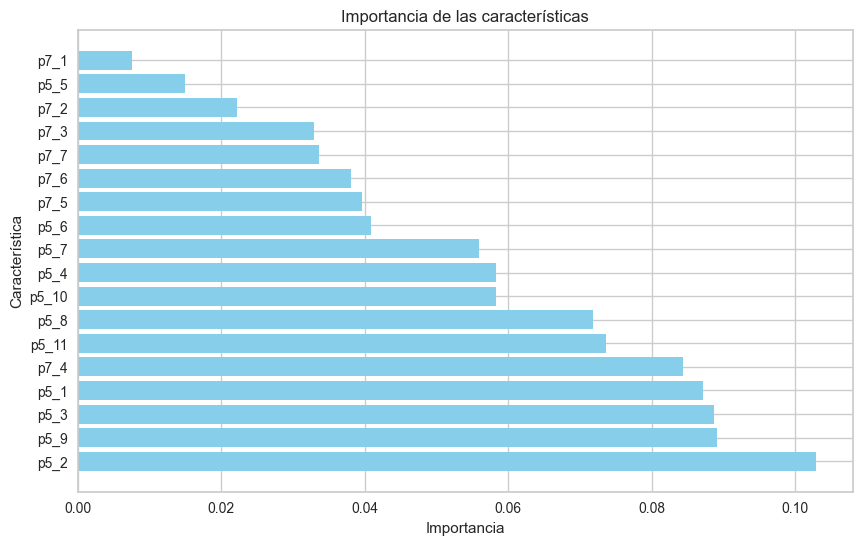

In [147]:
plt.figure(figsize=(10, 6))
plt.barh(df_features_top['Feature'], df_features_top['Importancia'], color='skyblue')
plt.xlabel('Importancia')
plt.ylabel('Característica')
plt.title('Importancia de las características')
plt.show()


In [148]:
df_filtered = df_features_top[df_features_top['Importancia'] > 0.08]
print("Características con importancia mayor a 0.08:")
print(df_filtered)

Características con importancia mayor a 0.08:
   Feature  Importancia
1     p5_2     0.102868
8     p5_9     0.089135
2     p5_3     0.088730
0     p5_1     0.087189
14    p7_4     0.084324


9. Aplica al menos un modelo de clasificación

In [149]:
X = df_datos3a[['p5_11', 'p5_9', 'p5_8', 'p5_2']]
y = df_datos3a['p8']


In [150]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [151]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [152]:
from sklearn.metrics import mean_squared_error, r2_score
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("MSE:", mse)
print("R-squared:", r2)


MSE: 3.8267925601583626
R-squared: 0.5434202741437266


El valor de R es bajo, voy a reducir a 0.07 para incluir más variables

In [223]:
df_filtered = df_features_top[df_features_top['Importancia'] > 0.05]
print("Características con importancia mayor a 0.05:")
print(df_filtered)

Características con importancia mayor a 0.05:
   Feature  Importancia
1     p5_2     0.102868
8     p5_9     0.089135
2     p5_3     0.088730
0     p5_1     0.087189
14    p7_4     0.084324
10   p5_11     0.073679
7     p5_8     0.071791
9    p5_10     0.058348
3     p5_4     0.058272
6     p5_7     0.055912


In [154]:
X = df_datos3a[['p5_11', 'p5_9', 'p5_8', 'p5_2','p5_10','p7_4','p5_4']]
y = df_datos3a['p8']


In [155]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [156]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [157]:
from sklearn.metrics import mean_squared_error, r2_score
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("MSE:", mse)
print("R-squared:", r2)


MSE: 3.7423801659144216
R-squared: 0.553491629519513


No hubo una mejora significativa, asi que voy a cambiar de modelo

In [158]:
#Probando con la regresion logistica

In [159]:
X = df_datos3a[['p5_11', 'p5_9', 'p5_8', 'p5_2', 'p5_10', 'p7_4', 'p5_4']]
y = df_datos3a['p8']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
clf = LogisticRegression(random_state=0, verbose=1)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
precision = accuracy_score(y_test, y_pred)
print("Precisión del modelo:", precision)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           80     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.30259D+00    |proj g|=  3.48912D-01

At iterate   50    f=  1.91223D+00    |proj g|=  7.40387D-02

At iterate  100    f=  1.78025D+00    |proj g|=  4.62537D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   80    100    106      1     0     0   4.625D-02   1.780D+00
  F =   1.7802456414121679     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
Precisión del modelo: 0.3405848787446505


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


Probando con Random Forest

In [185]:
model = RandomForestClassifier()

In [160]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.20,
                                                    random_state=777,
                                                    stratify = y)

In [186]:
model = {'n_estimators': [20, 40, 60, 80, 100, 120],
              'max_features': ['sqrt', 'log2'],
              'min_samples_split': [2, 4, 6]}

In [187]:
model = GridSearchCV(RandomForestClassifier(random_state=0),
                           param_grid,
                           cv=5,
                           scoring='accuracy',
                           n_jobs=-1)

In [188]:
model.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0), n_jobs=-1,
             param_grid={'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [20, 40, 60, 80, 100, 120]},
             scoring='accuracy')

In [189]:
mejores_parametros = model.best_params_
print(f"Mejores parámetros: {mejores_parametros}")
mejor_puntuacion = model.best_score_
print(f"Mejor score: {mejor_puntuacion}")

Mejores parámetros: {'max_features': 'sqrt', 'min_samples_split': 4, 'n_estimators': 60}
Mejor score: 0.7460770406326516


In [190]:
model.cv_results_

{'mean_fit_time': array([0.08989444, 0.16612816, 0.25454731, 0.32151904, 0.40913043,
        0.49504299, 0.08444986, 0.15595484, 0.23676906, 0.32196212,
        0.40347943, 0.46708322, 0.08349671, 0.15988817, 0.22910213,
        0.30188861, 0.39029112, 0.46388245, 0.08338275, 0.16565089,
        0.24878335, 0.33248401, 0.40609941, 0.49925833, 0.08155117,
        0.1631659 , 0.2437346 , 0.32011504, 0.39815941, 0.47469792,
        0.08275657, 0.16496048, 0.22916222, 0.31272545, 0.39330244,
        0.43992038]),
 'std_fit_time': array([0.00574375, 0.0039334 , 0.01121714, 0.01074714, 0.00222481,
        0.01267307, 0.00385339, 0.00539219, 0.00466779, 0.01157448,
        0.01147685, 0.01290195, 0.00471239, 0.00717489, 0.02155089,
        0.00493646, 0.00829289, 0.00443062, 0.00299535, 0.00575126,
        0.02098383, 0.00883387, 0.00411544, 0.00622893, 0.00113355,
        0.00203994, 0.01039495, 0.00807404, 0.00918493, 0.00684193,
        0.0028101 , 0.01079637, 0.00644914, 0.0079424 , 0.011

In [191]:
mejor_modelo = grid_search.best_estimator_

In [192]:
y_pred = mejor_modelo.predict(X_test)
score_test = accuracy_score(y_test, y_pred)
print(f"Score en test: {score_test}")

Score en test: 0.7507132667617689


Text(0.5, 31.222222222222214, 'Predict')

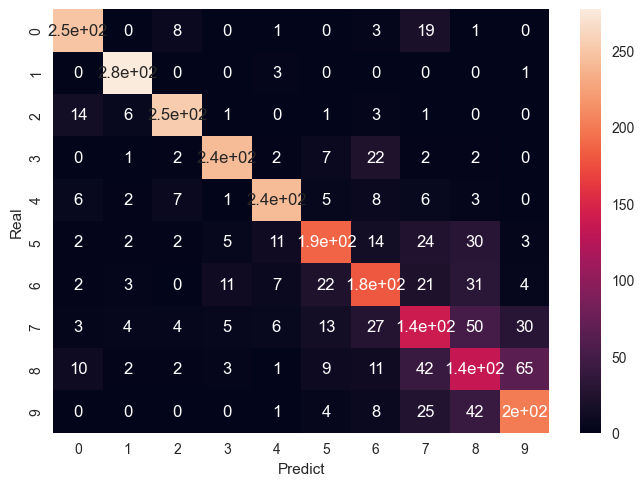

In [193]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True)
plt.ylabel("Real")
plt.xlabel("Predict")

Se puede observar que las clases 8, 7 y 1 son particularmente difíciles de predecir para el modelo. La matriz de confusión revela que el modelo tiene problemas para distinguir estas clases de otras, especialmente en los casos mencionados donde hay confusión notable con clases específicas. 
Opciones a considerar:
-  Re-balanceo de las features seleccionadas
-  Ajustar los parámetros

Implementando la recomendación del artículo: https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137

In [227]:
X = df_datos3a.loc[:, 'p5_1':'p7_7']  
y = df_datos3a['p8']                

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [228]:
explainer = shap.Explainer(model.predict, X_test)
shap_values = explainer(X_test)

PermutationExplainer explainer: 2805it [12:01,  3.83it/s]                                        


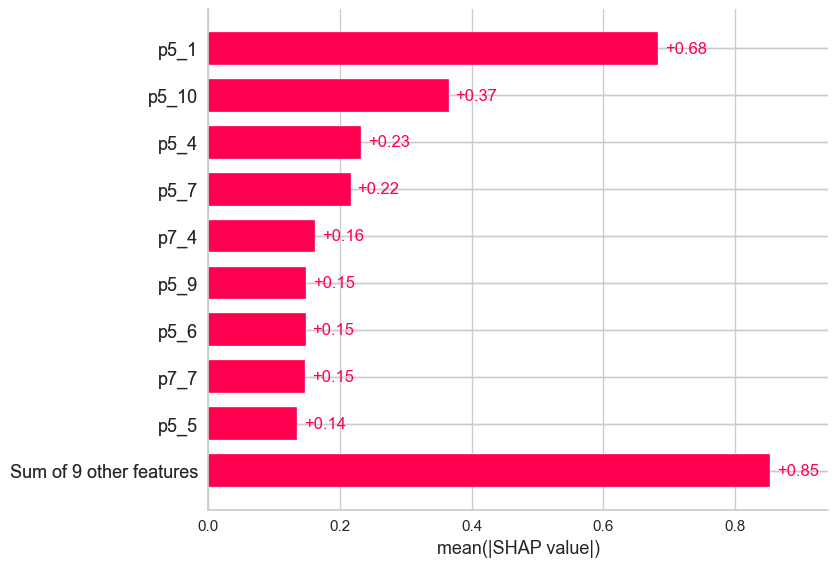

In [229]:
shap.plots.bar(shap_values)

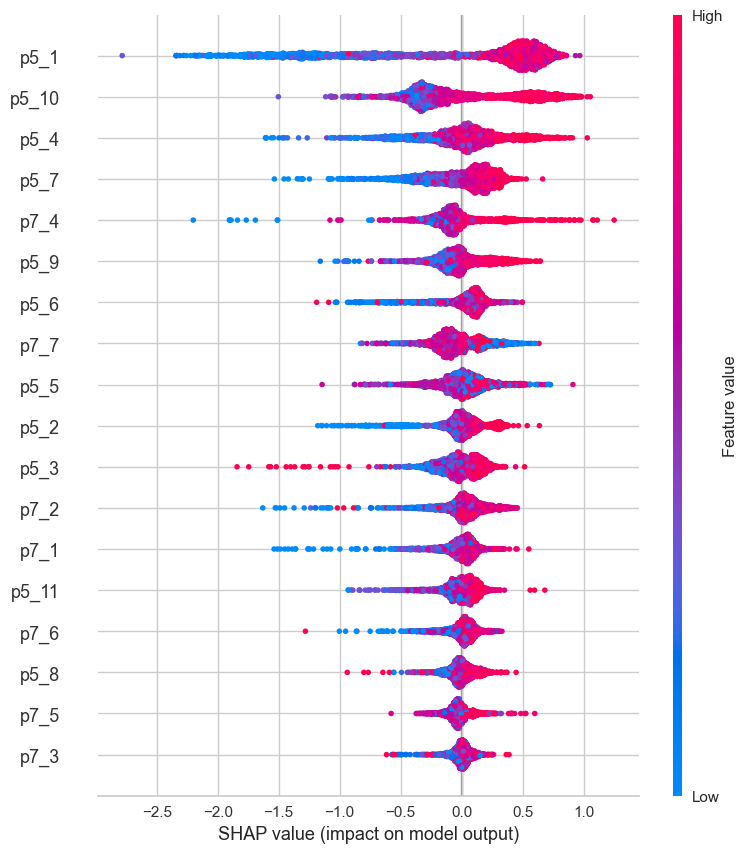

In [230]:
shap.summary_plot(shap_values)

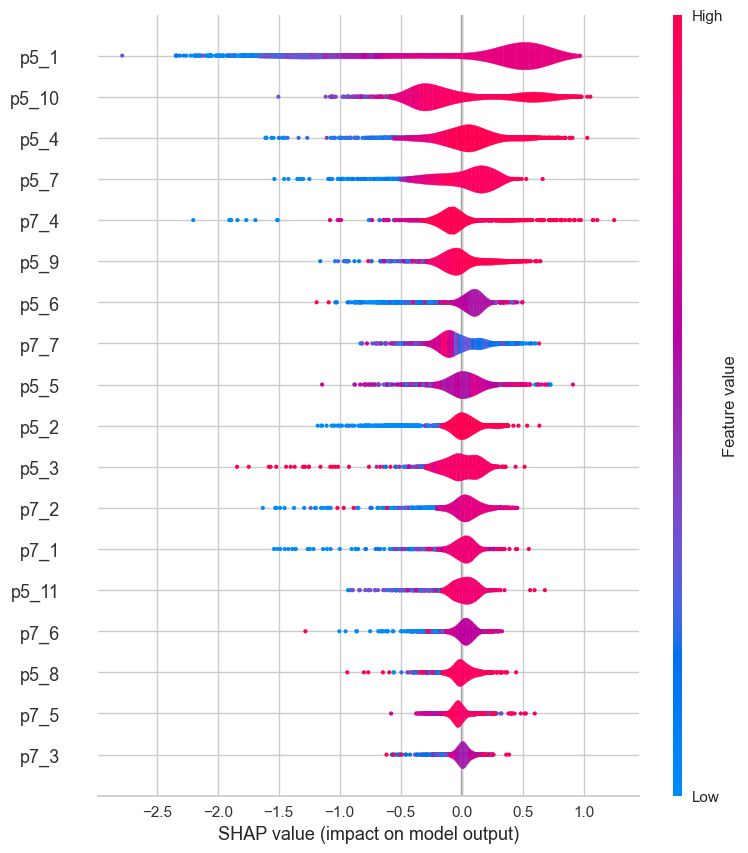

In [231]:
shap.summary_plot(shap_values, plot_type='violin')

In [251]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Asumo que df_datos es tu DataFrame y ya ha sido cargado con tus datos
X = df_datos3a.loc[:, 'p5_1':'p7_7'] 
y = df_datos3a['p8']  # Suponiendo que 'p8' es una variable categórica binaria para satisfacción

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Configuración del modelo KNN
knn = KNeighborsClassifier(n_neighbors=6)

# Entrenamiento del modelo
knn.fit(X_train, y_train)

# Predicción y Evaluación
y_pred = knn.predict(X_test)
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))


Accuracy: 0.8177603423680456
Confusion Matrix:
 [[296   0   0   1   0   0   1   2   0   1]
 [  2 265   0   0   0   0   0   0   0   1]
 [  3   2 279   0   3   1   0   0   0   0]
 [  0   0   2 268   2   0   4   0   0   2]
 [  1   0   0   1 272   5   1   2   1   1]
 [  2   0   0   4   5 245   8   2   6   0]
 [  2   0   5   6   4  11 207   7   8   5]
 [ 20   1   1   8   7  16  29 138  44  30]
 [  5   0   2   0   9  14  16  38 154  46]
 [  3   0   1   1   2  13   7  24  60 169]]
Classification Report:
               precision    recall  f1-score   support

           1       0.89      0.98      0.93       301
           2       0.99      0.99      0.99       268
           3       0.96      0.97      0.97       288
           4       0.93      0.96      0.95       278
           5       0.89      0.96      0.93       284
           6       0.80      0.90      0.85       272
           7       0.76      0.81      0.78       255
           8       0.65      0.47      0.54       294
          

Text(0.5, 31.222222222222214, 'Predict')

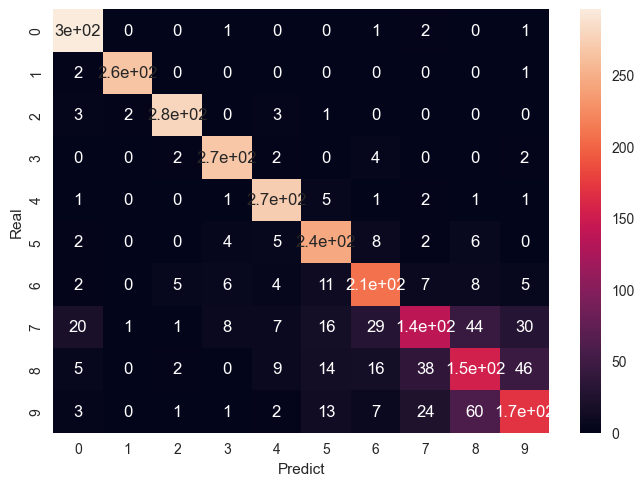

In [252]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True)
plt.ylabel("Real")
plt.xlabel("Predict")